In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
%matplotlib inline
sns.set_style('dark')

In [3]:
import os
#print(os.listdir("../Cryptocurrency prices for the year"))

# Method to read the data
import glob
path = r'../Cryptocurrency prices for the year' # use your path
all_files = glob.glob(path + "/*.csv")

li = []
 #combine all files in the list
for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True)

frame.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2020-12-31,0.184034,0.185749,0.176594,0.181397,0.181397,1132268397
1,2021-01-01,0.181382,0.184246,0.172022,0.175350,0.175350,1122218004
2,2021-01-02,0.175359,0.184253,0.169233,0.177423,0.177423,1408849504
3,2021-01-03,0.177382,0.208679,0.173376,0.204995,0.204995,2303857909
4,2021-01-04,0.205236,0.239661,0.194450,0.224762,0.224762,3260699086


In [4]:
# Rename the df
df = frame
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2020-12-31,0.184034,0.185749,0.176594,0.181397,0.181397,1132268397
1,2021-01-01,0.181382,0.184246,0.172022,0.175350,0.175350,1122218004
2,2021-01-02,0.175359,0.184253,0.169233,0.177423,0.177423,1408849504
3,2021-01-03,0.177382,0.208679,0.173376,0.204995,0.204995,2303857909
4,2021-01-04,0.205236,0.239661,0.194450,0.224762,0.224762,3260699086


In [5]:
print(f'The dataset contains {df.shape[0]} rows and {df.shape[1]} columns')
print(f'The dataset has {df.isnull().sum().sum()} missing values')
print(f'The dataset has {df.duplicated().sum()} duplicated values')

The dataset contains 12405 rows and 7 columns
The dataset has 0 missing values
The dataset has 0 duplicated values


In [6]:
#df.to_csv('df.csv', index=False)

# Exploratory Data Analysis

In [7]:
# Check the range of the date 
print(f'The dataset starts from {df.Date.min()} and ends at {df.Date.max()}')

The dataset starts from 2020-12-31 and ends at 2022-03-06


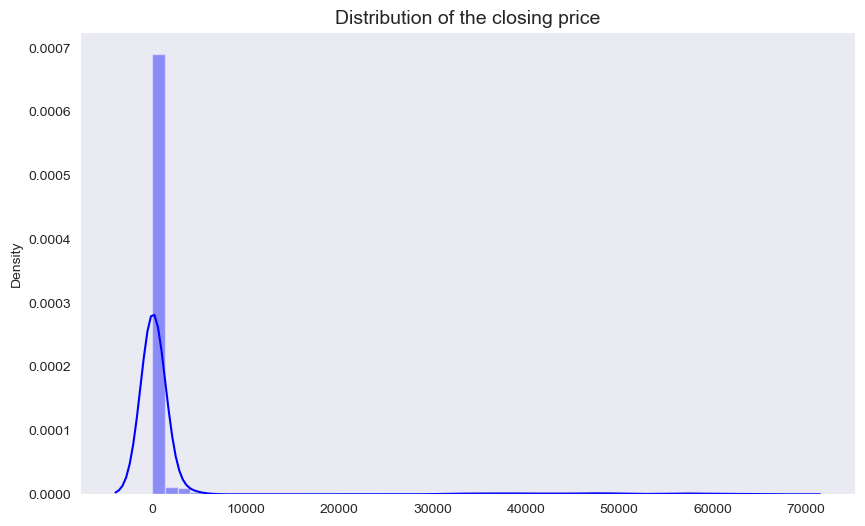

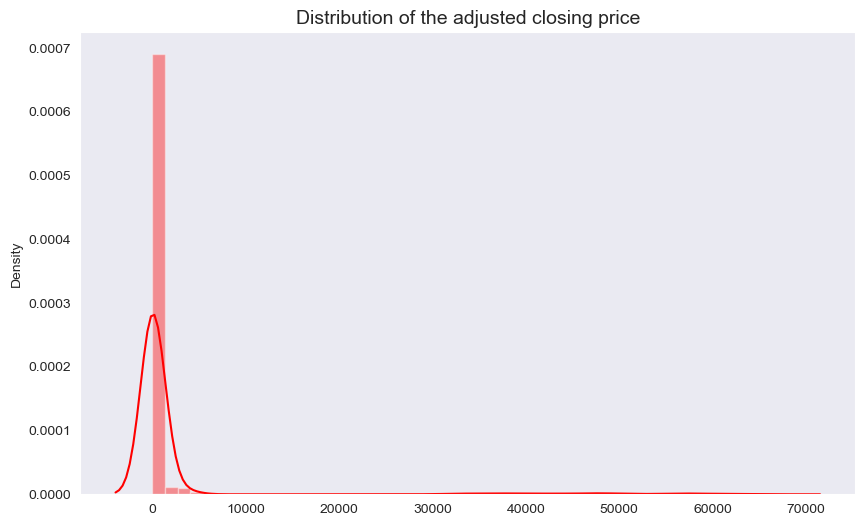

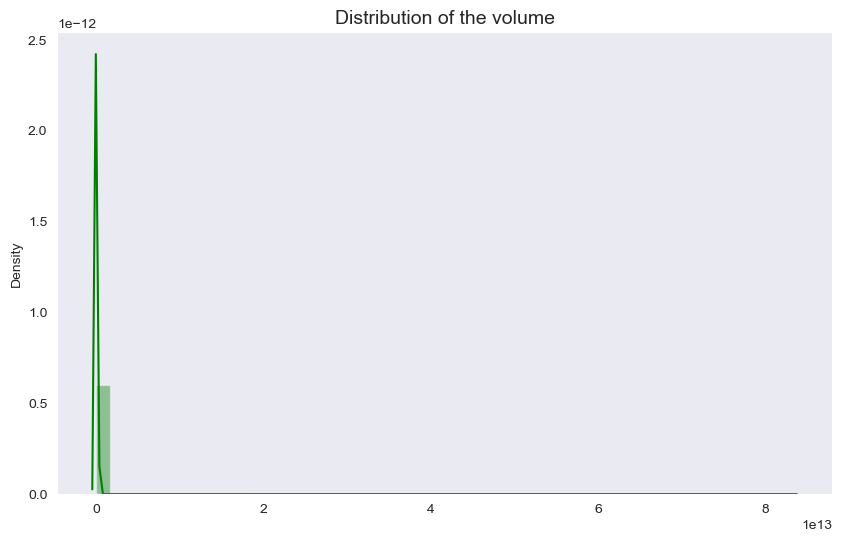

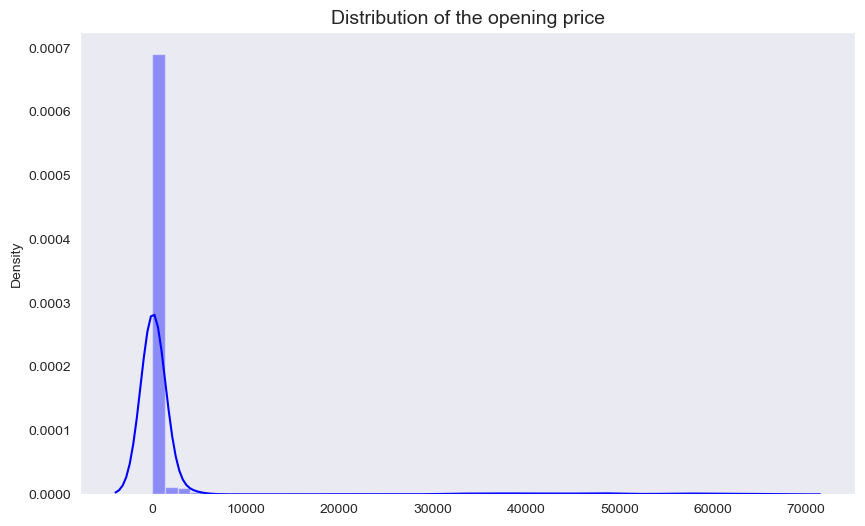

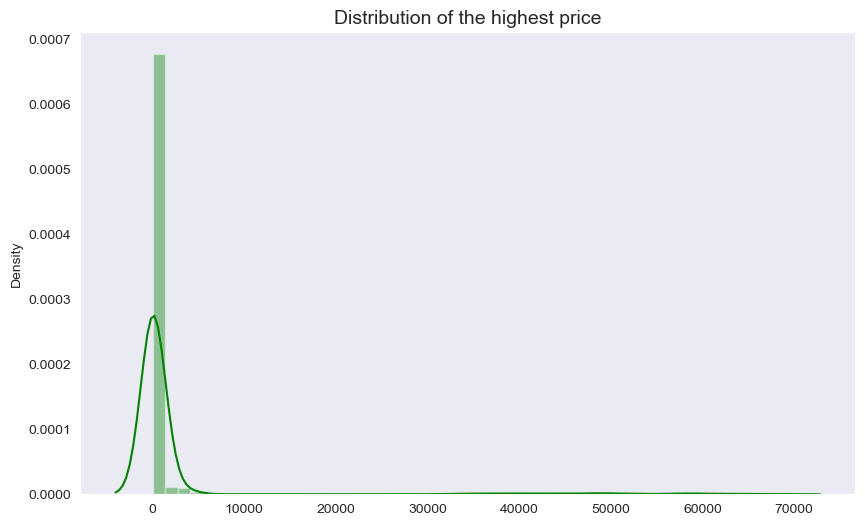

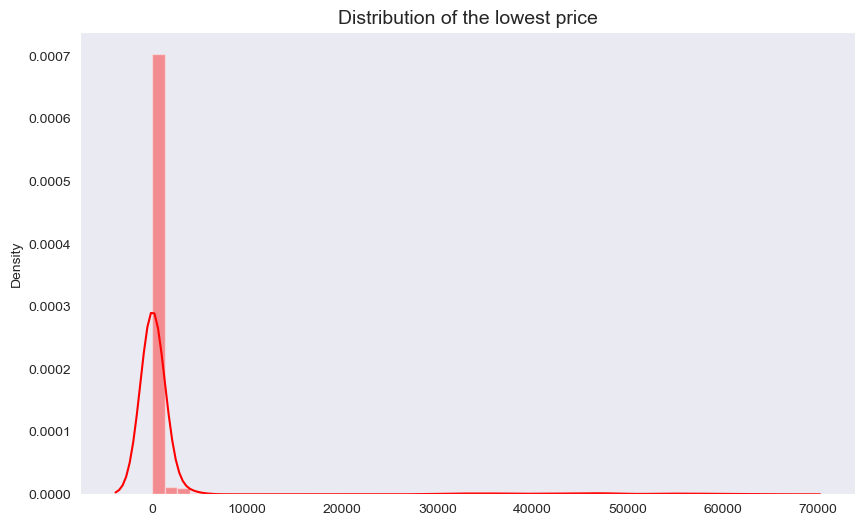

In [9]:
def distribution(feature, title, color):
    plt.figure(figsize=(10,6))
    sns.distplot(feature, color=color)
    plt.title(title, fontsize=14)
    plt.xlabel('')
    plt.show();

# Distribution of the closing price
distribution(df.Close, 'Distribution of the closing price', 'blue')

# Distribution of the adjusted closing price
distribution(df['Adj Close'], 'Distribution of the adjusted closing price', 'red')

# Distribution of the volume
distribution(df.Volume, 'Distribution of the volume', 'green')

# Distribution of the opening price
distribution(df['Open'], 'Distribution of the opening price', 'blue')

# Distribution of the highest price
distribution(df['High'], 'Distribution of the highest price', 'green')

# Distribution of the lowest price
distribution(df['Low'], 'Distribution of the lowest price', 'red')

* They have a relatively similar distribution.

<Figure size 1000x600 with 0 Axes>

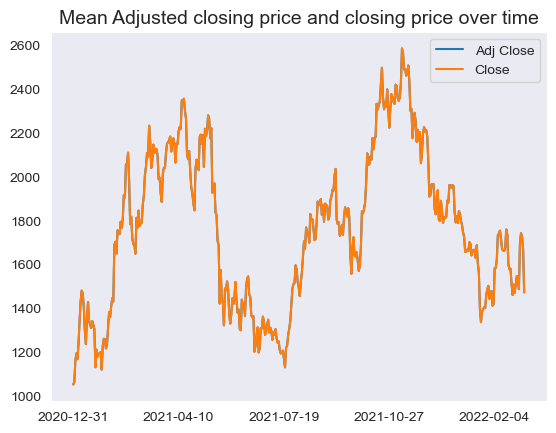

In [11]:
# Mean Adjusted closing price and closing price over time
plt.figure(figsize=(10,6))
df.groupby('Date')['Adj Close', 'Close'].mean().plot()
plt.legend(loc='best')
plt.title('Mean Adjusted closing price and closing price over time', fontsize=14)
plt.xlabel('')
plt.show();

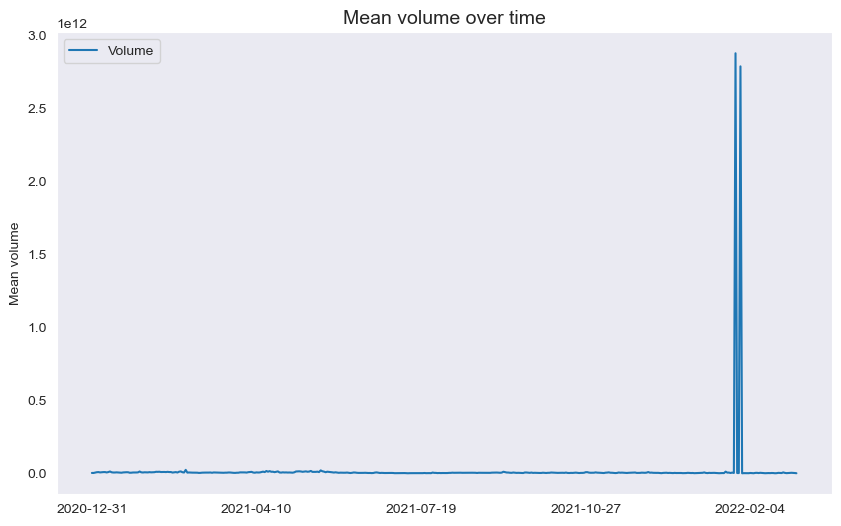

In [12]:
# Mean volume over time
plt.figure(figsize=(10,6))
df.groupby('Date')['Volume'].mean().plot()
plt.legend(loc='best')
plt.title('Mean volume over time', fontsize=14)
plt.xlabel('')
plt.ylabel('Mean volume')
plt.legend(loc='best')
plt.show();

<Figure size 1000x600 with 0 Axes>

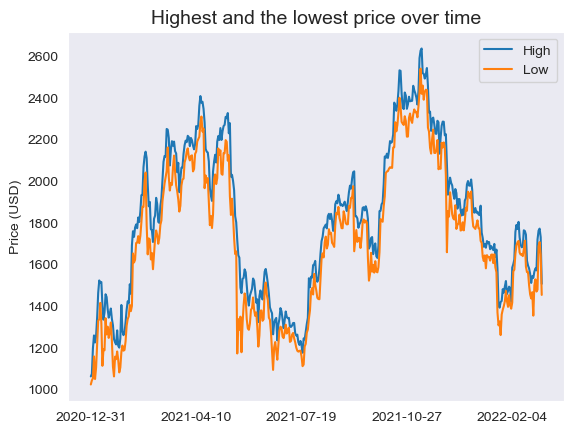

In [13]:
# Highest and the lowest price over time
plt.figure(figsize=(10,6))
df.groupby('Date')['High', 'Low'].mean().plot()
plt.legend(loc='best')
plt.title('Highest and the lowest price over time', fontsize=14)
plt.xlabel('')
plt.ylabel('Price (USD)')
plt.legend(loc='best')
plt.show();

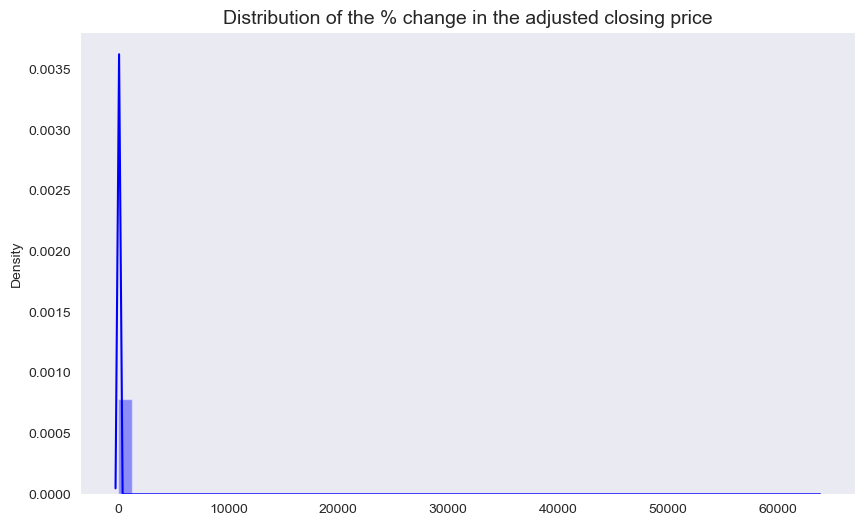

In [15]:
# % Change in the adjusted closing price
df['%Change'] = df['Adj Close'].pct_change()

# Replace infinite values with NaN
df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Distribution of the % change in the adjusted closing price
distribution(df['%Change'].dropna(), 'Distribution of the % change in the adjusted closing price', 'blue')


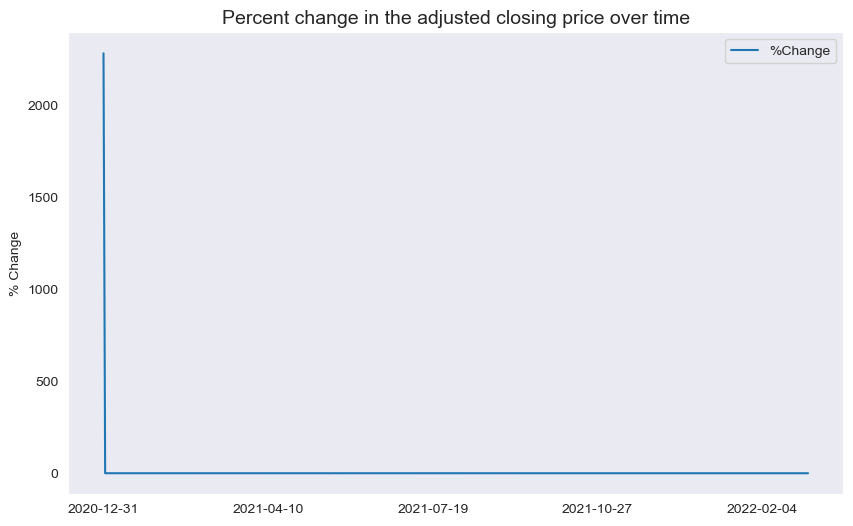

In [16]:
# Percent change in the adjusted closing price over time
plt.figure(figsize=(10,6))
df.groupby('Date')['%Change'].mean().plot()
plt.legend(loc='best')
plt.title('Percent change in the adjusted closing price over time', fontsize=14)
plt.xlabel('')
plt.ylabel('% Change')
plt.legend(loc='best')
plt.show();

In [17]:
# Method to plot the candlestick chart
def candlestick(df, title):
    fig = go.Figure(data=[go.Candlestick(x=df['Date'],
                    open=df['Open'],
                    high=df['High'],
                    low=df['Low'],
                    close=df['Close'])])
    fig.update_layout(title=title, yaxis_title='Price (USD)')
    fig.show();

# Candlestick chart for Bitcoin
candlestick(df, 'Candlestick chart for Market')

In [18]:
df['year'] = pd.DatetimeIndex(df['Date']).year
df['month'] = pd.DatetimeIndex(df['Date']).month

# Method to plot the candlestick chart for a particular year
def candlestick_year(year, title):
    fig = go.Figure(data=[go.Candlestick(x=df[df['year']==year]['Date'],
                    open=df[df['year']==year]['Open'],
                    high=df[df['year']==year]['High'],
                    low=df[df['year']==year]['Low'],
                    close=df[df['year']==year]['Close'])])
    fig.update_layout(title=title, yaxis_title='Price (USD)')
    fig.show();

# Candlestick chart for Bitcoin in 2021
candlestick_year(2021, 'Candlestick chart for Market in 2021')

# Candlestick chart for Bitcoin in 2022
candlestick_year(2022, 'Candlestick chart for Market in 2022')

In [20]:
# Method to plot the closing price over the years
def closing_price_year(year, title):
    fig = px.line(df[df['year']==year], x='month', y='Close', title=title)
    fig.show();

# Closing price over the months in 2021
closing_price_year(2021, 'Closing Price over the months in 2021')

# Closing price over the months in 2022
closing_price_year(2022, 'Closing Price over the months in 2022')

In [21]:
# Stacked barchart of all values over the years
def stacked_barchart_year(year, title):
    fig = go.Figure(data=[
        go.Bar(name='Open', x=df[df['year']==year]['month'], y=df[df['year']==year]['Open']),
        go.Bar(name='Close', x=df[df['year']==year]['month'], y=df[df['year']==year]['Close']),
        go.Bar(name='High', x=df[df['year']==year]['month'], y=df[df['year']==year]['High']),
        go.Bar(name='Low', x=df[df['year']==year]['month'], y=df[df['year']==year]['Low']),
        go.Bar(name='Adj Close', x=df[df['year']==year]['month'], y=df[df['year']==year]['Adj Close']),
        go.Bar(name='Volume', x=df[df['year']==year]['month'], y=df[df['year']==year]['Volume'])
    ])
    fig.update_layout(barmode='stack', title=title)
    fig.show();

stacked_barchart_year(2021, 'Stacked barchart of all values over the months in 2021')
stacked_barchart_year(2022, 'Stacked barchart of all values over the months in 2022')

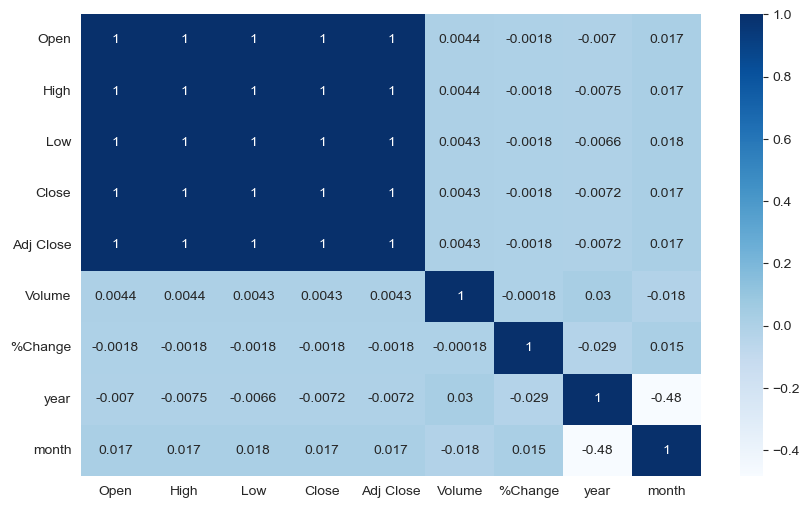

In [22]:
corr = df.corr()

# Heatmap of the correlation matrix
plt.figure(figsize=(10,6))
sns.heatmap(corr, annot=True, cmap='Blues');

In [23]:
# Correlation between the features and the target
corr['Adj Close'].sort_values(ascending=False).head(10)

Close        1.000000
Adj Close    1.000000
High         0.999656
Low          0.999582
Open         0.999204
month        0.016988
Volume       0.004343
%Change     -0.001820
year        -0.007179
Name: Adj Close, dtype: float64

In [26]:
# Get the high correlated feats with over 0.5
high_corr_features = corr.index[abs(corr['Adj Close'])>0.5]
high_corr_features = high_corr_features.drop('Adj Close')
high_corr_features

Index(['Open', 'High', 'Low', 'Close'], dtype='object')

# Modelling

The Mean Absolute Error of Linear Regression is 3873.8633432070155
The Mean Squared Error of Linear Regression is 71938131.38049385
The R2 Score of Linear Regression is 0.12688593158054395


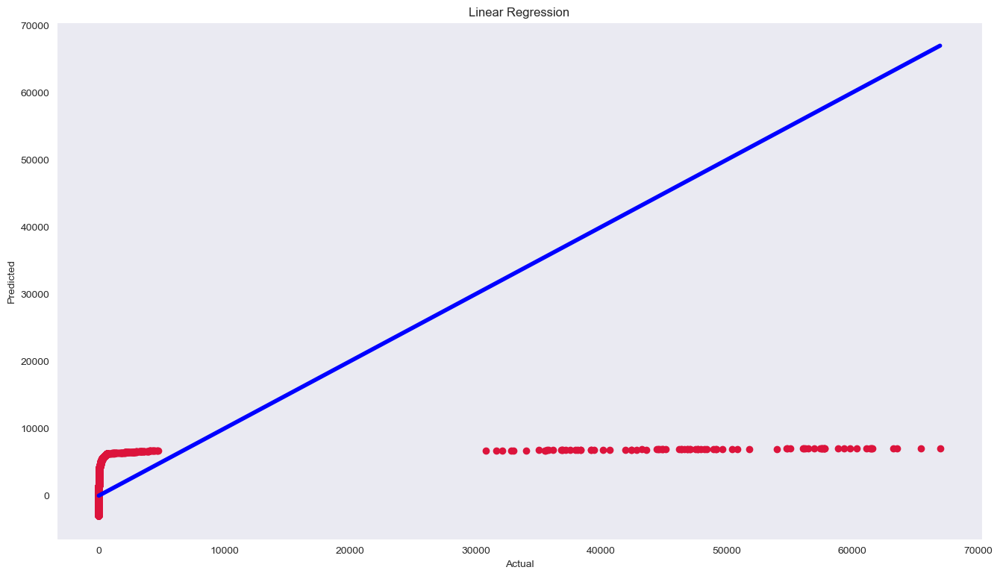

In [28]:
# Split the data into train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Linear Regression
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)

lr_y_pred = lr.predict(X_test)

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
print(f'The Mean Absolute Error of Linear Regression is {mean_absolute_error(y_test, lr_y_pred)}')
print(f'The Mean Squared Error of Linear Regression is {mean_squared_error(y_test, lr_y_pred)}')    
print(f'The R2 Score of Linear Regression is {r2_score(y_test, lr_y_pred)}')

# Visualize the Linear Regression results
plt.figure(figsize=(16, 9))
plt.scatter(y_test, lr_y_pred, c='crimson')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], c='blue', lw=4)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Linear Regression')
plt.show();




The Mean Absolute Error of Random Forest is 4.6190914211926195
The Mean Squared Error of Random Forest is 1175.087420760058
The R2 Score of Random Forest is 0.9999857379481646


Text(0.5, 1.0, 'Random Forest')

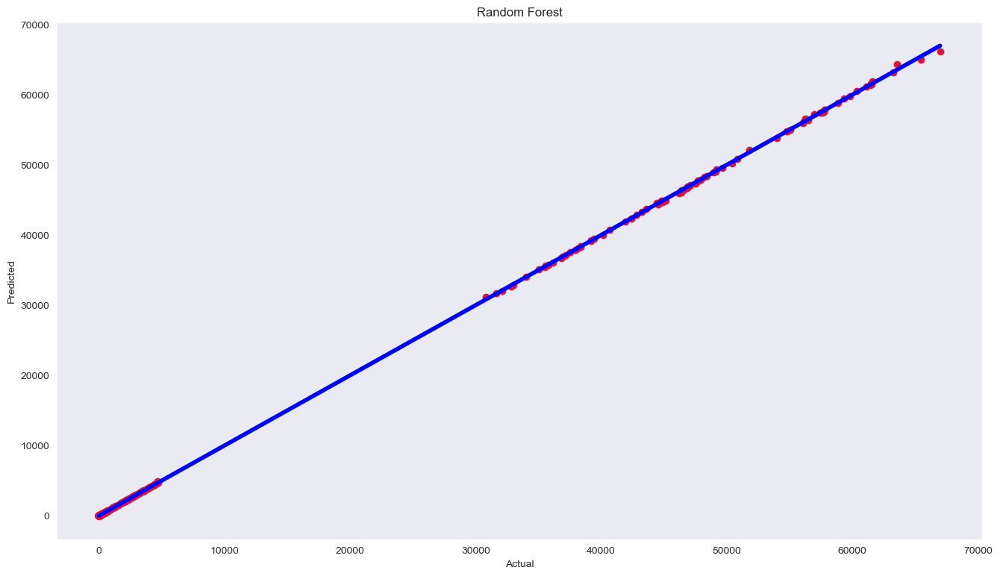

In [30]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

rf_y_pred = rf.predict(X_test)

print(f'The Mean Absolute Error of Random Forest is {mean_absolute_error(y_test, rf_y_pred)}')
print(f'The Mean Squared Error of Random Forest is {mean_squared_error(y_test, rf_y_pred)}')
print(f'The R2 Score of Random Forest is {r2_score(y_test, rf_y_pred)}')

# Visualize the Random Forest results
plt.figure(figsize=(16, 9))
plt.scatter(y_test, rf_y_pred, c='crimson')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], c='blue', lw=4)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Random Forest')

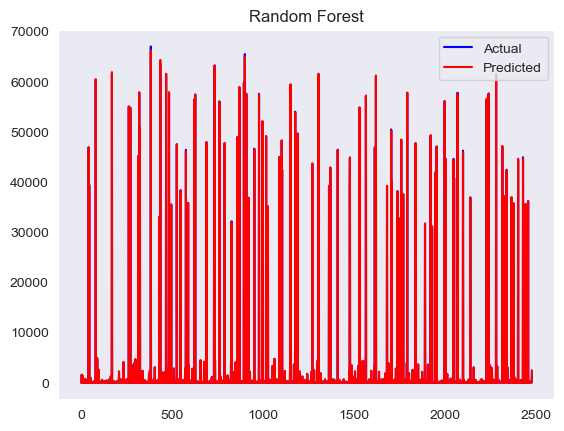

In [31]:
plt.plot(y_test.values, color='blue', label='Actual')
plt.plot(rf_y_pred, color='red', label='Predicted')
plt.legend(loc='best')
plt.title('Random Forest')
plt.show();

# Time Series

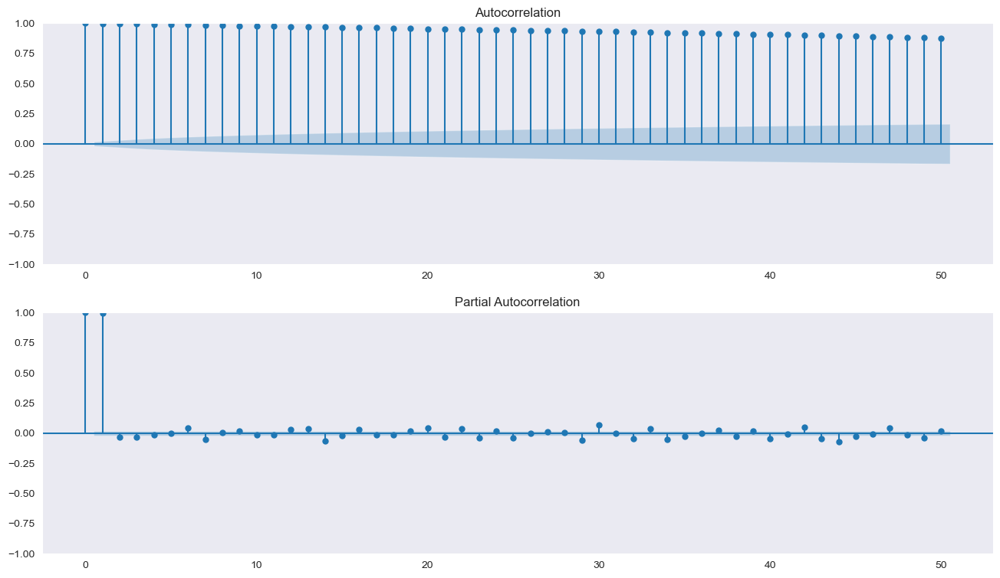

In [32]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Add title
def add_title(ax, title):
    ax.set_title(title, fontsize=14, fontweight='bold')
    return ax

_, ax = plt.subplots(2, figsize=(16, 9))
add_title(ax[0], 'Autocorrelation')
add_title(ax[1], 'Partial Autocorrelation')
plot_acf(df['Adj Close'], ax=ax[0], lags=50)
plot_pacf(df['Adj Close'], ax=ax[1], lags=50)
plt.show();

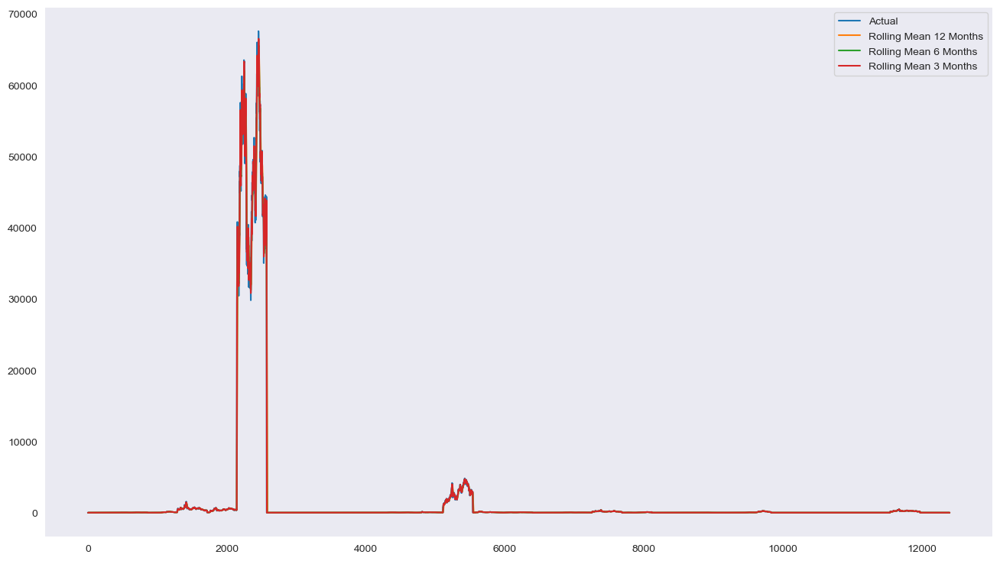

In [33]:
# Rolling mean
def rolling_mean(df, window):
    rolling_mean = df.rolling(window=window).mean()
    return rolling_mean

plt.figure(figsize=(16, 9))
plt.plot(df['Adj Close'], label='Actual')
plt.plot(rolling_mean(df['Adj Close'], 12), label='Rolling Mean 12 Months')
plt.plot(rolling_mean(df['Adj Close'], 6), label='Rolling Mean 6 Months')
plt.plot(rolling_mean(df['Adj Close'], 3), label='Rolling Mean 3 Months')
plt.legend(loc='best')

rolling_mean_12 = rolling_mean(df['Adj Close'], 12)
rolling_mean_6 = rolling_mean(df['Adj Close'], 6)
rolling_mean_3 = rolling_mean(df['Adj Close'], 3)

plt.show();

<Figure size 1600x900 with 0 Axes>

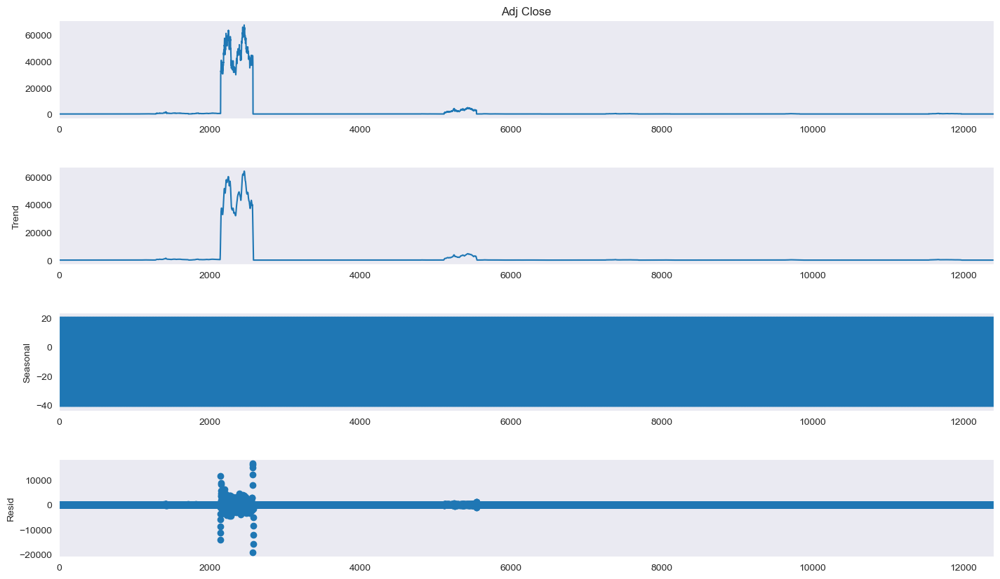

In [34]:
# Decomposition
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(df['Adj Close'], period=12)
fig = plt.figure(figsize=(16, 9))
fig = decomposition.plot()
fig.set_size_inches(16, 9)
plt.show();

In [37]:
# ADF test
## Null hypothesis: the time series is non-stationary ##
from statsmodels.tsa.stattools import adfuller
def adf_test(series, title=''):
    print('************************************')
    print(f'Augmented Dick-Fuller Test: {title}')
    print('************************************')

    result = adfuller(series.dropna(), autolag='AIC') #dropna() handles differenced data
    labels = ['ADF test statistic', 'p-value', '#lags used', '#observations']
    out = pd.Series(result[0:4], index=labels)
    for key, val in result[4].items():
        out[f'critical value ({key})'] = val
    print(out.to_string())
    if result[1] <= 0.05:
        print('Strong evidence against the null hypothesis')
        print('Reject the null hypothesis')
        print('Data has no unit root and is stationary')
    else:
        print('Weak evidence against the null hypothesis')
        print('Fail to reject the null hypothesis')
        print('Data has a unit root and is non-stationary')

adf_test(df['Adj Close'], title='Adjusted Closing Price')

************************************
Augmented Dick-Fuller Test: Adjusted Closing Price
************************************
ADF test statistic         -4.008061
p-value                     0.001369
#lags used                 41.000000
#observations           12363.000000
critical value (1%)        -3.430879
critical value (5%)        -2.861774
critical value (10%)       -2.566894
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary
